# Finding a latent space representation for UsideU people
### WIth feature, pixel, and target propagation loss
### And automatic cropping with dlib
### Constraining input to be orthogonal
### Using the FaceSpace API

In [1]:
%load_ext autoreload
%autoreload 2
from FaceSpace import PreprocessFaceDir, MakeFaceData, MakeFaceModel, TrainFaceModel
from FaceSpace import SaveFaceSpace, LoadFaceSpace, GetFaceFromZSpace, ShowFace 

### 1. Preprocess raw photos to get cropped, aligned photos

In [2]:
RawImagesPath = 'UsideU FaceSpace/images'
AlignedImagesPath = 'UsideU FaceSpace/images/aligned'
PreprocessFaceDir(RawImagesPath, AlignedImagesPath)

### 2. Make FaceData object based on aligned images
#### FaceData contains Zspace (one-hot encoded, orthogonal vectors for each face), a to-be-learned Wspace, tensor representations of faces, and feature maps of faces

Getting tensors of (aligned) face images
ZDims unspecified, will be inferred from number of images provided.
Zdims set equal to Size:  8
Using default Zspace - identity matrix (orthogonal vectors) of dim  8
Using default Wspace - zero matrix of dim  8


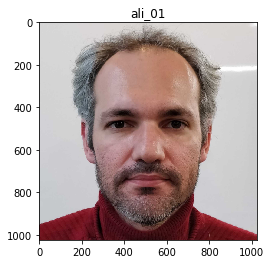

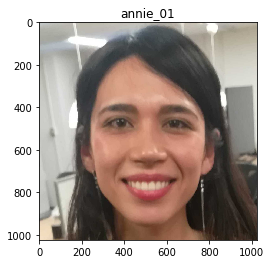

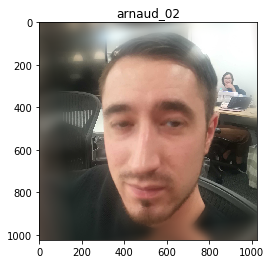

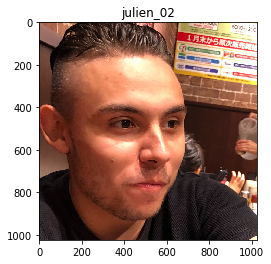

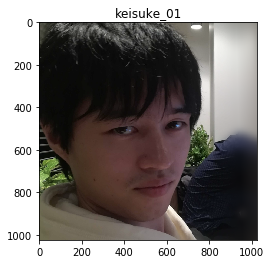

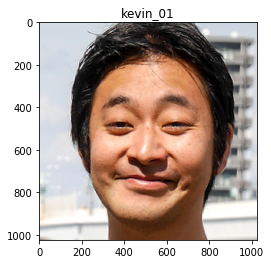

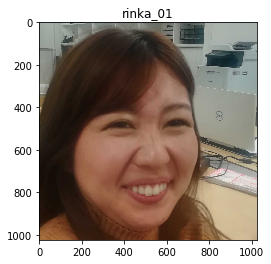

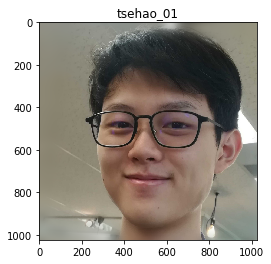

Reshaped Wspace to match number of stored faces, Wspace dim:  torch.Size([8, 18, 512])
Setting Wspaces to be the mean latent vector from  W_mean.pt


In [2]:
FaceData = MakeFaceData('UsideU FaceSpace/images/aligned')

### 3. Make FaceModel based on FaceData object
#### FaceModel is a StyleGAN with the mapping network replaced with a decompression encoder

In [3]:
FaceModel = MakeFaceModel(FaceData)

No Zdims explicitly specified, inferring Zdims from FaceData, Zdims=8


### 4. Train the FaceModel to map orthogonal Zspace to an extended Wspace using feature, pixel, and target propagation loss using a learned Wspace

Note: No FeatureMaps stored in FaceData, will extract target feature maps each batch
Training for basis face encoding (synthetic face generation)
Training with target propagation loss only for this initial phase.


/home/tsehao/anaconda3/envs/tth20191007/lib/python3.7/site-packages/torch/nn/functional.py:2479: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


Epoch:  1
Batch:  1
This batch:  ['keisuke_01', 'rinka_01']
Total time elapsed:  0.69089674949646  s
Feature loss:  132.39710998535156  | Pixel loss:  0.11854829639196396  | Target prop loss:  2.9898576736450195
Weighted - Feature loss:  13239.710998535156  | Pixel loss:  11.854829639196396  | Target prop loss:  29898.576736450195
Total loss:  43150.140625


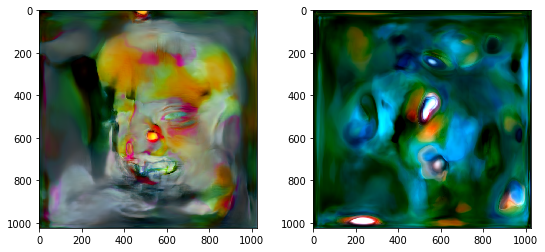

Target W+ output
W+ loss:  9969.951171875


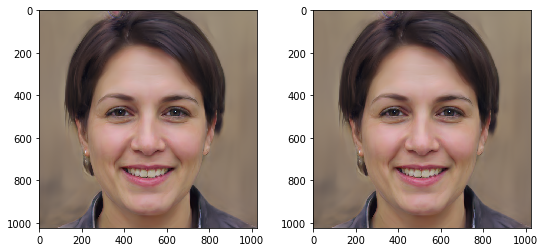

Epoch:  1
Batch:  2
This batch:  ['ali_01', 'julien_02']
Total time elapsed:  2.047375202178955  s
Feature loss:  142.092041015625  | Pixel loss:  0.19955937564373016  | Target prop loss:  3.236459493637085
Weighted - Feature loss:  14209.2041015625  | Pixel loss:  19.955937564373016  | Target prop loss:  32364.59493637085
Total loss:  46593.7578125


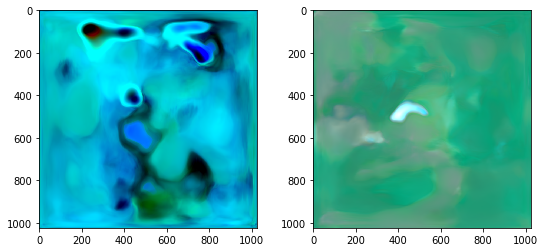

Target W+ output
W+ loss:  12616.1083984375


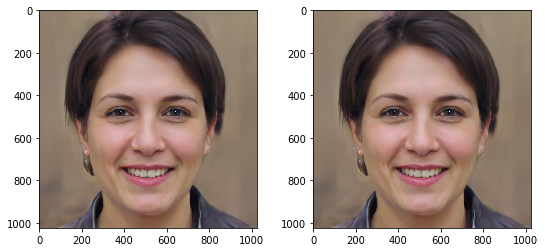

Epoch:  1
Batch:  3
This batch:  ['kevin_01', 'annie_01']
Total time elapsed:  3.4009554386138916  s
Feature loss:  143.5439910888672  | Pixel loss:  0.28884223103523254  | Target prop loss:  7.2181220054626465
Weighted - Feature loss:  14354.399108886719  | Pixel loss:  28.884223103523254  | Target prop loss:  72181.22005462646
Total loss:  86564.5


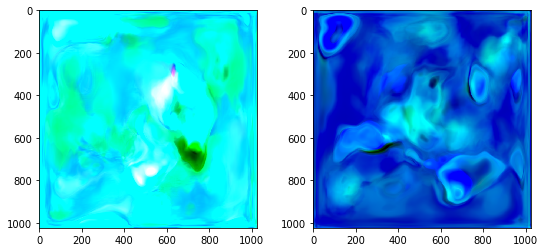

Target W+ output
W+ loss:  8648.828125


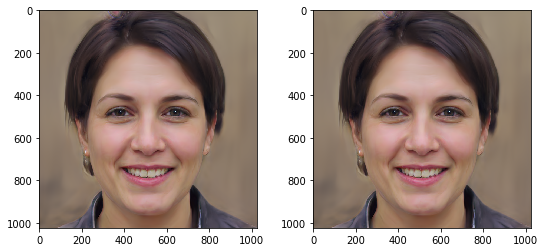

Epoch:  1
Batch:  4
This batch:  ['arnaud_02', 'tsehao_01']
Total time elapsed:  4.687271356582642  s
Feature loss:  95.35348510742188  | Pixel loss:  0.2952154576778412  | Target prop loss:  3.01542329788208
Weighted - Feature loss:  9535.348510742188  | Pixel loss:  29.52154576778412  | Target prop loss:  30154.2329788208
Total loss:  39719.1015625


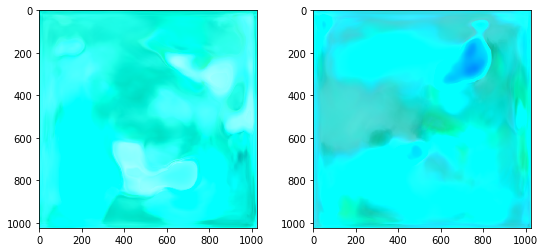

Target W+ output
W+ loss:  9007.142578125


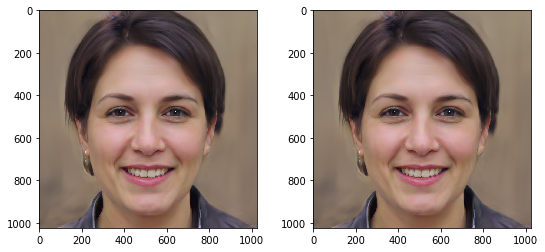

Epoch:  25
Batch:  1
This batch:  ['arnaud_02', 'annie_01']
Total time elapsed:  54.13766431808472  s
Feature loss:  48.92375183105469  | Pixel loss:  0.05684952437877655  | Target prop loss:  0.02944927103817463
Weighted - Feature loss:  4892.375183105469  | Pixel loss:  5.684952437877655  | Target prop loss:  294.4927103817463
Total loss:  5192.552734375


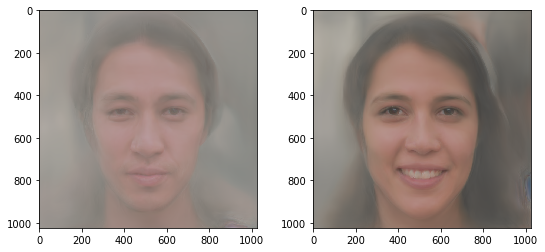

Target W+ output
W+ loss:  4307.3095703125


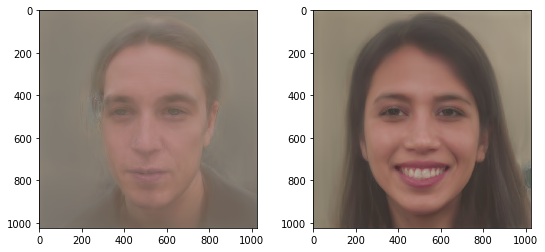

Epoch:  25
Batch:  2
This batch:  ['keisuke_01', 'rinka_01']
Total time elapsed:  55.51587200164795  s
Feature loss:  61.3077278137207  | Pixel loss:  0.09748194366693497  | Target prop loss:  0.024147285148501396
Weighted - Feature loss:  6130.77278137207  | Pixel loss:  9.748194366693497  | Target prop loss:  241.47285148501396
Total loss:  6381.99365234375


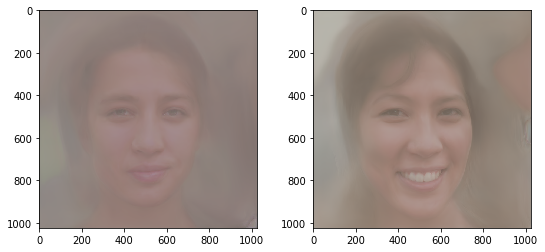

Target W+ output
W+ loss:  5880.9462890625


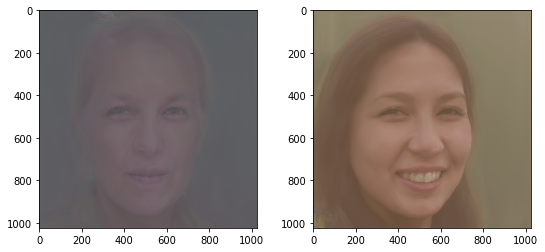

Epoch:  25
Batch:  3
This batch:  ['julien_02', 'ali_01']
Total time elapsed:  56.84355640411377  s
Feature loss:  92.52643585205078  | Pixel loss:  0.06969883292913437  | Target prop loss:  0.026986239477992058
Weighted - Feature loss:  9252.643585205078  | Pixel loss:  6.969883292913437  | Target prop loss:  269.8623947799206
Total loss:  9529.4755859375


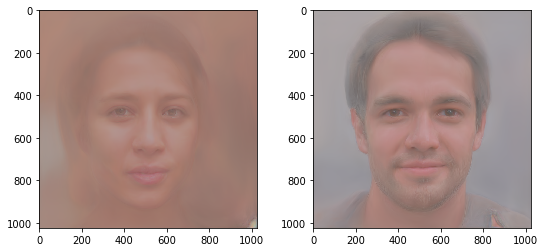

Target W+ output
W+ loss:  8482.572265625


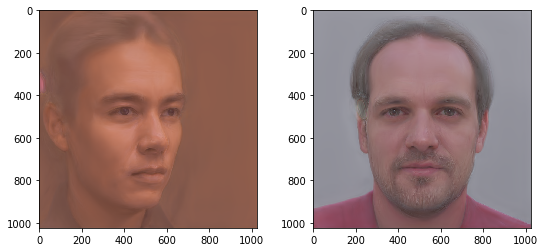

Epoch:  25
Batch:  4
This batch:  ['tsehao_01', 'kevin_01']
Total time elapsed:  58.14869284629822  s
Feature loss:  64.21568298339844  | Pixel loss:  0.04782508686184883  | Target prop loss:  0.02989908680319786
Weighted - Feature loss:  6421.568298339844  | Pixel loss:  4.782508686184883  | Target prop loss:  298.9908680319786
Total loss:  6725.341796875


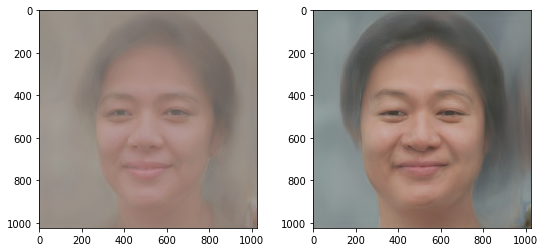

Target W+ output
W+ loss:  5714.85791015625


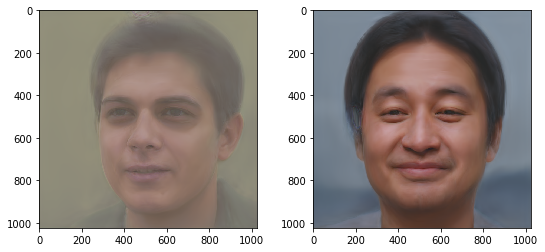

Epoch:  50
Batch:  1
This batch:  ['annie_01', 'keisuke_01']
Total time elapsed:  109.05530571937561  s
Feature loss:  51.386741638183594  | Pixel loss:  0.04984954372048378  | Target prop loss:  0.02799699455499649
Weighted - Feature loss:  5138.674163818359  | Pixel loss:  4.984954372048378  | Target prop loss:  279.9699455499649
Total loss:  5423.62890625


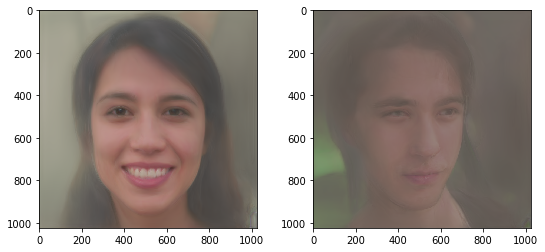

Target W+ output
W+ loss:  4893.44677734375


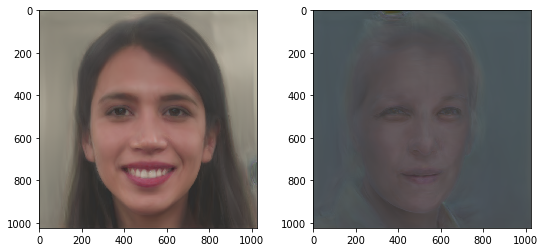

Epoch:  50
Batch:  2
This batch:  ['tsehao_01', 'rinka_01']
Total time elapsed:  110.41522312164307  s
Feature loss:  52.655311584472656  | Pixel loss:  0.032678600400686264  | Target prop loss:  0.030751844868063927
Weighted - Feature loss:  5265.531158447266  | Pixel loss:  3.2678600400686264  | Target prop loss:  307.51844868063927
Total loss:  5576.31787109375


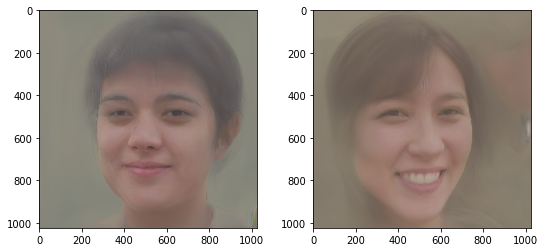

Target W+ output
W+ loss:  5129.5732421875


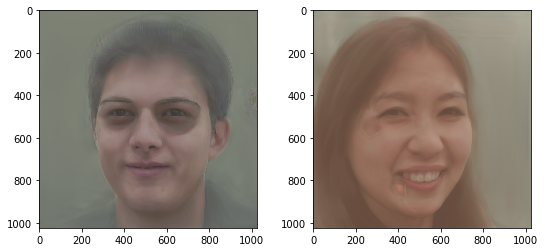

Epoch:  50
Batch:  3
This batch:  ['kevin_01', 'julien_02']
Total time elapsed:  111.73389148712158  s
Feature loss:  95.4529037475586  | Pixel loss:  0.05898454785346985  | Target prop loss:  0.032506994903087616
Weighted - Feature loss:  9545.29037475586  | Pixel loss:  5.898454785346985  | Target prop loss:  325.06994903087616
Total loss:  9876.2587890625


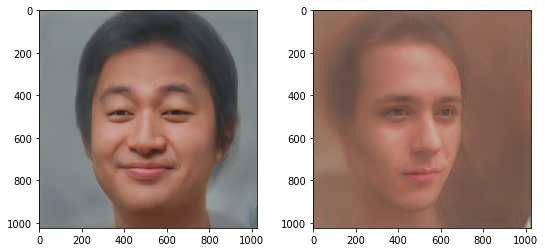

Target W+ output
W+ loss:  8314.7841796875


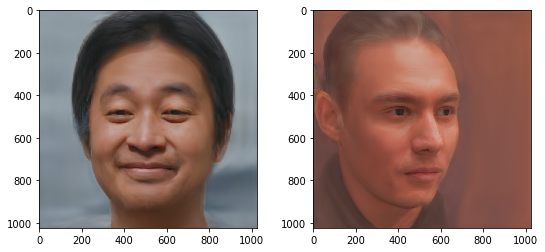

Epoch:  50
Batch:  4
This batch:  ['arnaud_02', 'ali_01']
Total time elapsed:  113.10407447814941  s
Feature loss:  48.19202423095703  | Pixel loss:  0.05128990113735199  | Target prop loss:  0.03318876400589943
Weighted - Feature loss:  4819.202423095703  | Pixel loss:  5.128990113735199  | Target prop loss:  331.8876400589943
Total loss:  5156.21923828125


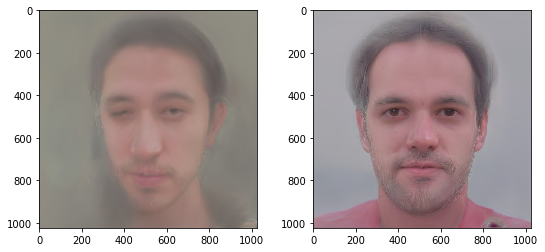

Target W+ output
W+ loss:  4098.2353515625


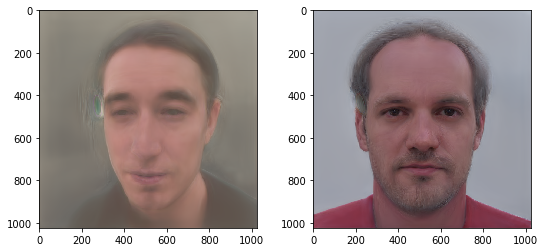

Epoch:  75
Batch:  1
This batch:  ['ali_01', 'rinka_01']
Total time elapsed:  164.3937611579895  s
Feature loss:  47.516849517822266  | Pixel loss:  0.03562426567077637  | Target prop loss:  0.03793788328766823
Weighted - Feature loss:  4751.684951782227  | Pixel loss:  3.5624265670776367  | Target prop loss:  379.3788328766823
Total loss:  5134.62646484375


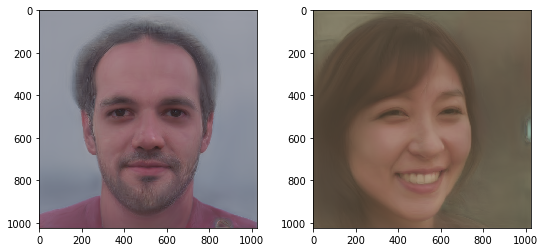

Target W+ output
W+ loss:  4284.0166015625


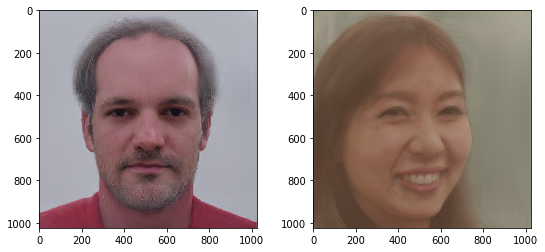

Epoch:  75
Batch:  2
This batch:  ['keisuke_01', 'arnaud_02']
Total time elapsed:  165.77930521965027  s
Feature loss:  52.896785736083984  | Pixel loss:  0.051712144166231155  | Target prop loss:  0.037468016147613525
Weighted - Feature loss:  5289.678573608398  | Pixel loss:  5.1712144166231155  | Target prop loss:  374.68016147613525
Total loss:  5669.5302734375


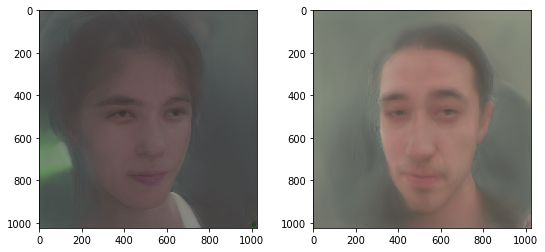

Target W+ output
W+ loss:  4899.45849609375


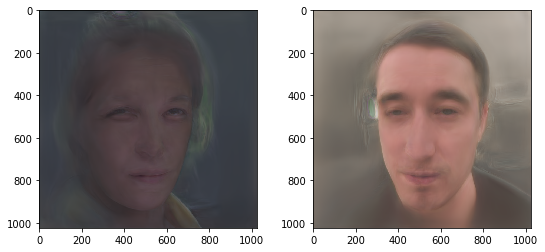

Epoch:  75
Batch:  3
This batch:  ['julien_02', 'tsehao_01']
Total time elapsed:  167.1262664794922  s
Feature loss:  85.75724792480469  | Pixel loss:  0.035193510353565216  | Target prop loss:  0.03768564760684967
Weighted - Feature loss:  8575.724792480469  | Pixel loss:  3.5193510353565216  | Target prop loss:  376.8564760684967
Total loss:  8956.1005859375


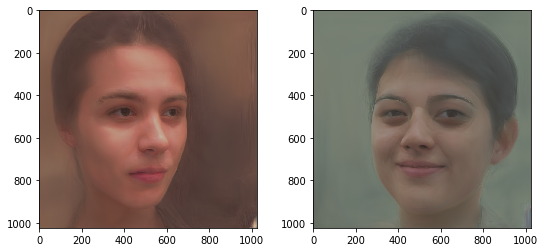

Target W+ output
W+ loss:  7473.65087890625


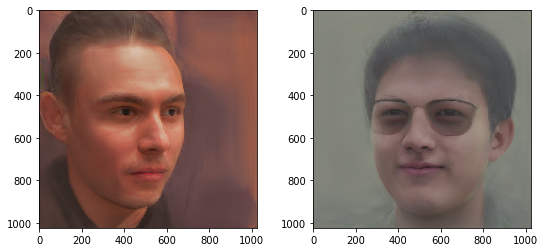

Epoch:  75
Batch:  4
This batch:  ['annie_01', 'kevin_01']
Total time elapsed:  168.52821493148804  s
Feature loss:  53.02606201171875  | Pixel loss:  0.03269359469413757  | Target prop loss:  0.03805321082472801
Weighted - Feature loss:  5302.606201171875  | Pixel loss:  3.2693594694137573  | Target prop loss:  380.5321082472801
Total loss:  5686.408203125


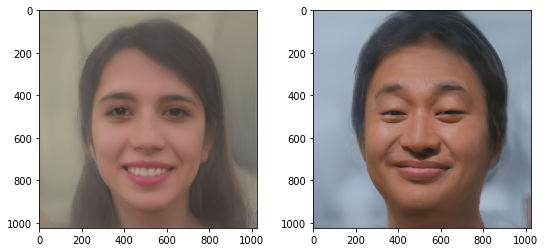

Target W+ output
W+ loss:  4172.3173828125


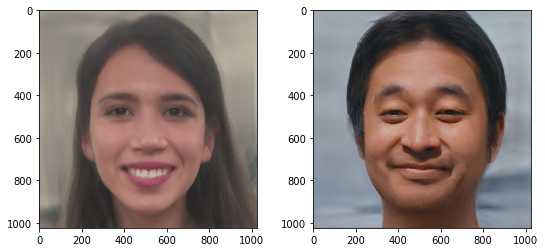

Epoch:  100
Batch:  1
This batch:  ['arnaud_02', 'kevin_01']
Total time elapsed:  219.00935864448547  s
Feature loss:  48.67512893676758  | Pixel loss:  0.0433606319129467  | Target prop loss:  0.04213010147213936
Weighted - Feature loss:  4867.512893676758  | Pixel loss:  4.33606319129467  | Target prop loss:  421.3010147213936
Total loss:  5293.1494140625


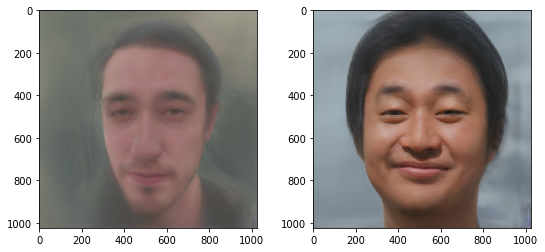

Target W+ output
W+ loss:  4104.7021484375


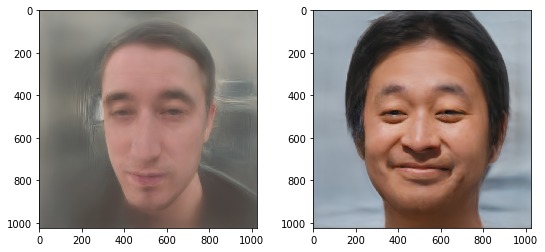

Epoch:  100
Batch:  2
This batch:  ['julien_02', 'rinka_01']
Total time elapsed:  220.51560354232788  s
Feature loss:  86.34068298339844  | Pixel loss:  0.03932676091790199  | Target prop loss:  0.0399760976433754
Weighted - Feature loss:  8634.068298339844  | Pixel loss:  3.9326760917901993  | Target prop loss:  399.76097643375397
Total loss:  9037.76171875


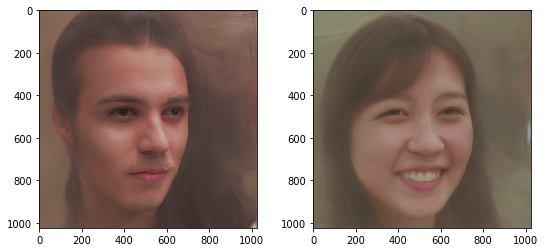

Target W+ output
W+ loss:  7586.17822265625


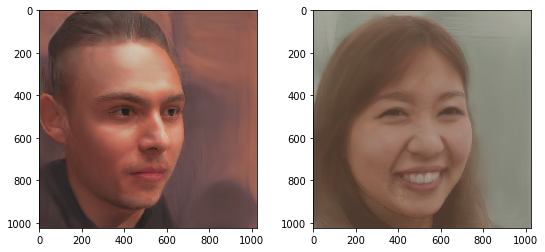

Epoch:  100
Batch:  3
This batch:  ['tsehao_01', 'annie_01']
Total time elapsed:  221.88497591018677  s
Feature loss:  41.887062072753906  | Pixel loss:  0.019713355228304863  | Target prop loss:  0.037263672798871994
Weighted - Feature loss:  4188.706207275391  | Pixel loss:  1.9713355228304863  | Target prop loss:  372.63672798871994
Total loss:  4563.31396484375


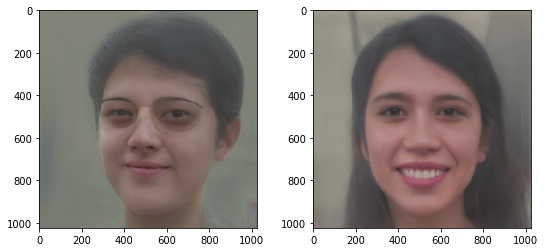

Target W+ output
W+ loss:  3523.289794921875


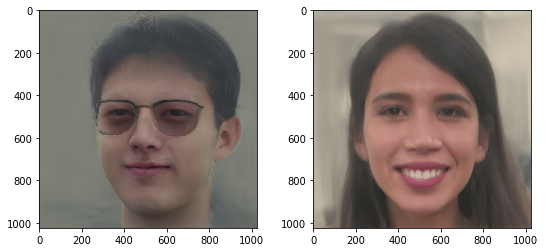

Epoch:  100
Batch:  4
This batch:  ['ali_01', 'keisuke_01']
Total time elapsed:  223.24637627601624  s
Feature loss:  50.061344146728516  | Pixel loss:  0.03943425044417381  | Target prop loss:  0.04119107127189636
Weighted - Feature loss:  5006.134414672852  | Pixel loss:  3.9434250444173813  | Target prop loss:  411.9107127189636
Total loss:  5421.98828125


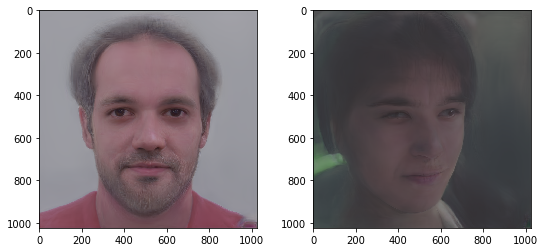

Target W+ output
W+ loss:  4504.6376953125


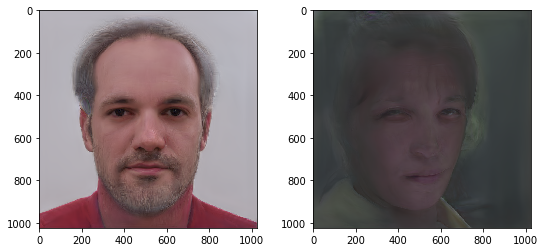

Cycle:  1 LR:  0.01
Epoch:  1
Batch:  1
This batch:  ['rinka_01', 'ali_01']
Total time elapsed:  0.27214789390563965  s
Feature loss:  45.220741271972656  | Pixel loss:  0.031116163358092308  | Target prop loss:  0.0
Weighted - Feature loss:  4522.074127197266  | Pixel loss:  3.111616335809231  | Target prop loss:  0.0
Total loss:  4525.18603515625


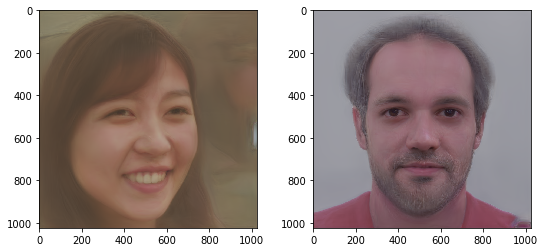

Epoch:  1
Batch:  2
This batch:  ['tsehao_01', 'keisuke_01']
Total time elapsed:  0.8376138210296631  s
Feature loss:  55.06046676635742  | Pixel loss:  0.031243398785591125  | Target prop loss:  0.0
Weighted - Feature loss:  5506.046676635742  | Pixel loss:  3.1243398785591125  | Target prop loss:  0.0
Total loss:  5509.17138671875


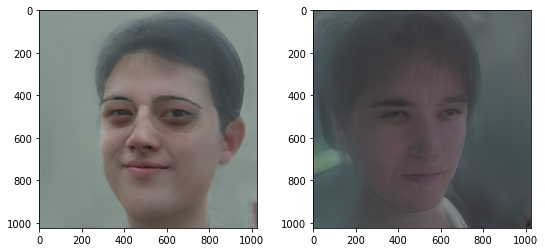

Epoch:  1
Batch:  3
This batch:  ['arnaud_02', 'julien_02']
Total time elapsed:  1.4018566608428955  s
Feature loss:  85.55355834960938  | Pixel loss:  0.05045963451266289  | Target prop loss:  0.0
Weighted - Feature loss:  8555.355834960938  | Pixel loss:  5.045963451266289  | Target prop loss:  0.0
Total loss:  8560.4013671875


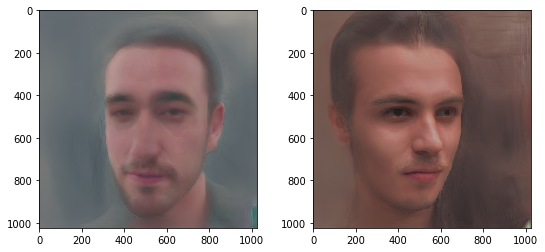

Epoch:  1
Batch:  4
This batch:  ['kevin_01', 'annie_01']
Total time elapsed:  2.0273311138153076  s
Feature loss:  56.11760711669922  | Pixel loss:  0.04516957700252533  | Target prop loss:  0.0
Weighted - Feature loss:  5611.760711669922  | Pixel loss:  4.516957700252533  | Target prop loss:  0.0
Total loss:  5616.27783203125


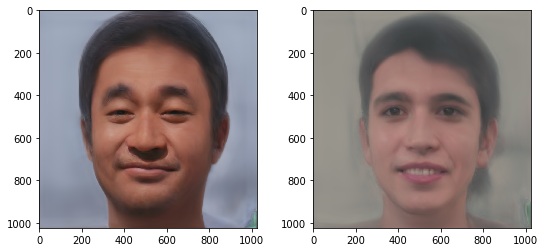

Epoch:  25
Batch:  1
This batch:  ['rinka_01', 'keisuke_01']
Total time elapsed:  26.310279607772827  s
Feature loss:  55.06583786010742  | Pixel loss:  0.03692926838994026  | Target prop loss:  0.0
Weighted - Feature loss:  5506.583786010742  | Pixel loss:  3.692926838994026  | Target prop loss:  0.0
Total loss:  5510.27685546875


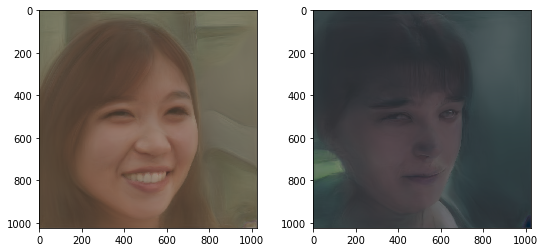

Epoch:  25
Batch:  2
This batch:  ['julien_02', 'tsehao_01']
Total time elapsed:  26.93786120414734  s
Feature loss:  81.5060043334961  | Pixel loss:  0.02960164099931717  | Target prop loss:  0.0
Weighted - Feature loss:  8150.600433349609  | Pixel loss:  2.960164099931717  | Target prop loss:  0.0
Total loss:  8153.560546875


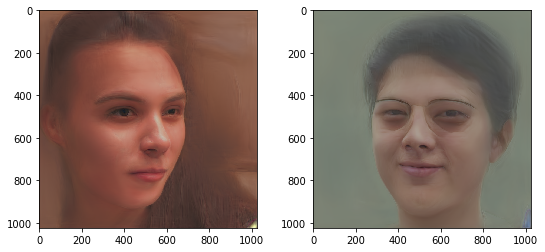

Epoch:  25
Batch:  3
This batch:  ['annie_01', 'kevin_01']
Total time elapsed:  27.504563570022583  s
Feature loss:  50.871917724609375  | Pixel loss:  0.03596419468522072  | Target prop loss:  0.0
Weighted - Feature loss:  5087.1917724609375  | Pixel loss:  3.596419468522072  | Target prop loss:  0.0
Total loss:  5090.7880859375


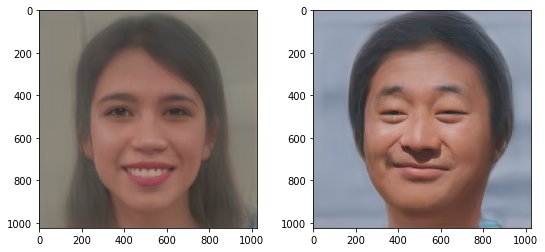

Epoch:  25
Batch:  4
This batch:  ['ali_01', 'arnaud_02']
Total time elapsed:  28.06864905357361  s
Feature loss:  43.099281311035156  | Pixel loss:  0.03952695056796074  | Target prop loss:  0.0
Weighted - Feature loss:  4309.928131103516  | Pixel loss:  3.952695056796074  | Target prop loss:  0.0
Total loss:  4313.880859375


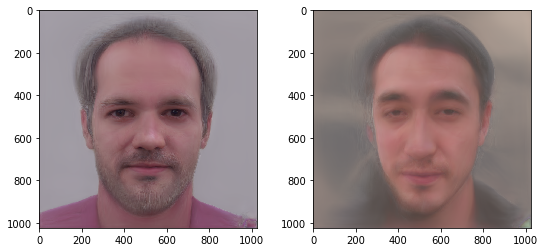

Epoch:  50
Batch:  1
This batch:  ['kevin_01', 'ali_01']
Total time elapsed:  53.42345142364502  s
Feature loss:  45.586666107177734  | Pixel loss:  0.02790060080587864  | Target prop loss:  0.0
Weighted - Feature loss:  4558.666610717773  | Pixel loss:  2.790060080587864  | Target prop loss:  0.0
Total loss:  4561.45654296875


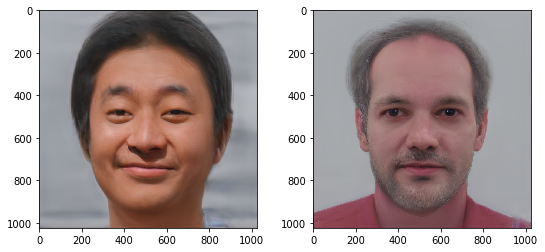

Epoch:  50
Batch:  2
This batch:  ['keisuke_01', 'annie_01']
Total time elapsed:  53.9861900806427  s
Feature loss:  45.057167053222656  | Pixel loss:  0.03242336958646774  | Target prop loss:  0.0
Weighted - Feature loss:  4505.716705322266  | Pixel loss:  3.2423369586467743  | Target prop loss:  0.0
Total loss:  4508.958984375


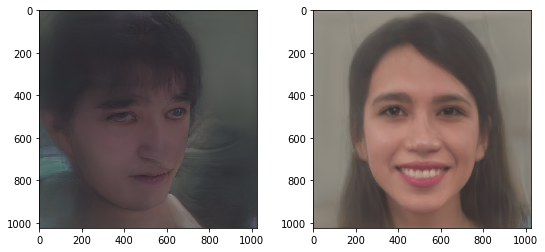

Epoch:  50
Batch:  3
This batch:  ['julien_02', 'rinka_01']
Total time elapsed:  54.56299328804016  s
Feature loss:  80.80635070800781  | Pixel loss:  0.033671945333480835  | Target prop loss:  0.0
Weighted - Feature loss:  8080.635070800781  | Pixel loss:  3.3671945333480835  | Target prop loss:  0.0
Total loss:  8084.00244140625


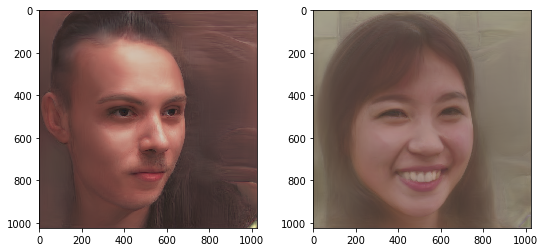

Epoch:  50
Batch:  4
This batch:  ['arnaud_02', 'tsehao_01']
Total time elapsed:  55.14186334609985  s
Feature loss:  43.246826171875  | Pixel loss:  0.024864977225661278  | Target prop loss:  0.0
Weighted - Feature loss:  4324.6826171875  | Pixel loss:  2.4864977225661278  | Target prop loss:  0.0
Total loss:  4327.1689453125


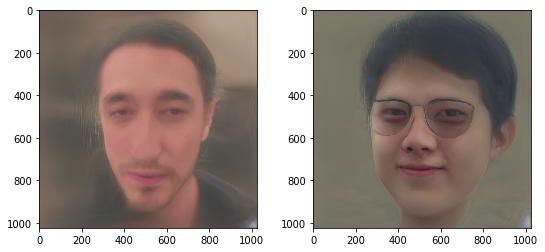

Epoch:  75
Batch:  1
This batch:  ['tsehao_01', 'rinka_01']
Total time elapsed:  80.98734021186829  s
Feature loss:  42.791053771972656  | Pixel loss:  0.018096139654517174  | Target prop loss:  0.0
Weighted - Feature loss:  4279.105377197266  | Pixel loss:  1.8096139654517174  | Target prop loss:  0.0
Total loss:  4280.9150390625


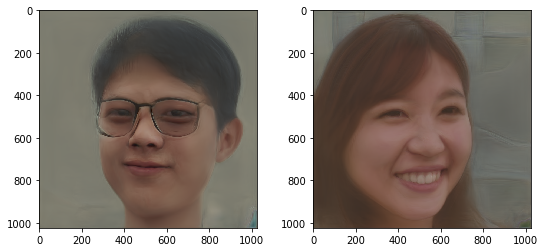

Epoch:  75
Batch:  2
This batch:  ['arnaud_02', 'julien_02']
Total time elapsed:  81.57346606254578  s
Feature loss:  76.2706298828125  | Pixel loss:  0.03956667706370354  | Target prop loss:  0.0
Weighted - Feature loss:  7627.06298828125  | Pixel loss:  3.9566677063703537  | Target prop loss:  0.0
Total loss:  7631.01953125


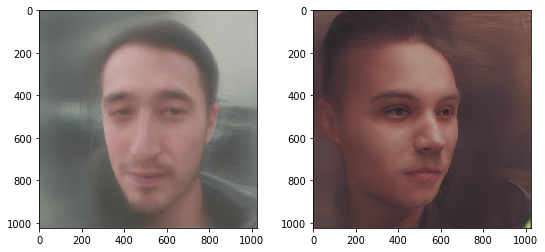

Epoch:  75
Batch:  3
This batch:  ['ali_01', 'keisuke_01']
Total time elapsed:  82.14474940299988  s
Feature loss:  46.7727165222168  | Pixel loss:  0.029993904754519463  | Target prop loss:  0.0
Weighted - Feature loss:  4677.27165222168  | Pixel loss:  2.9993904754519463  | Target prop loss:  0.0
Total loss:  4680.27099609375


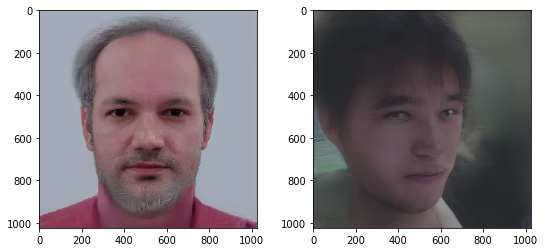

Epoch:  75
Batch:  4
This batch:  ['kevin_01', 'annie_01']
Total time elapsed:  82.70920300483704  s
Feature loss:  44.211734771728516  | Pixel loss:  0.022384217008948326  | Target prop loss:  0.0
Weighted - Feature loss:  4421.173477172852  | Pixel loss:  2.2384217008948326  | Target prop loss:  0.0
Total loss:  4423.41162109375


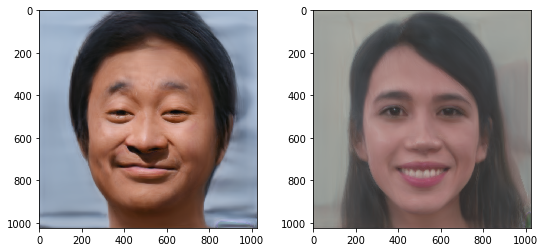

Epoch:  100
Batch:  1
This batch:  ['kevin_01', 'keisuke_01']
Total time elapsed:  108.96366930007935  s
Feature loss:  48.51905059814453  | Pixel loss:  0.03218358755111694  | Target prop loss:  0.0
Weighted - Feature loss:  4851.905059814453  | Pixel loss:  3.2183587551116943  | Target prop loss:  0.0
Total loss:  4855.12353515625


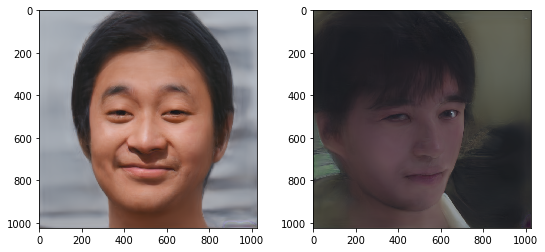

Epoch:  100
Batch:  2
This batch:  ['tsehao_01', 'ali_01']
Total time elapsed:  109.59246301651001  s
Feature loss:  37.271053314208984  | Pixel loss:  0.01844789832830429  | Target prop loss:  0.0
Weighted - Feature loss:  3727.1053314208984  | Pixel loss:  1.844789832830429  | Target prop loss:  0.0
Total loss:  3728.949951171875


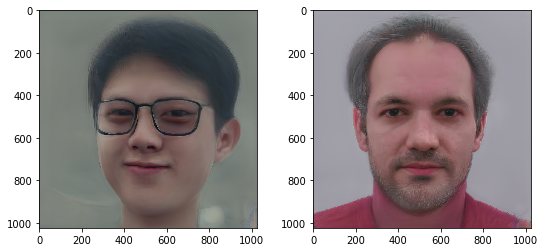

Epoch:  100
Batch:  3
This batch:  ['annie_01', 'arnaud_02']
Total time elapsed:  110.15202760696411  s
Feature loss:  35.734012603759766  | Pixel loss:  0.020365208387374878  | Target prop loss:  0.0
Weighted - Feature loss:  3573.4012603759766  | Pixel loss:  2.036520838737488  | Target prop loss:  0.0
Total loss:  3575.43798828125


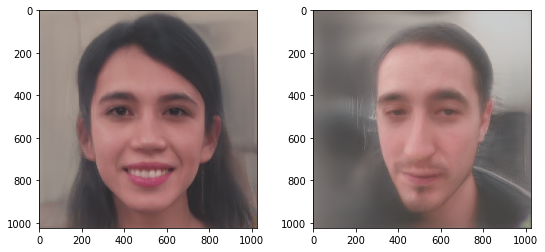

Epoch:  100
Batch:  4
This batch:  ['julien_02', 'rinka_01']
Total time elapsed:  110.71737170219421  s
Feature loss:  76.2424545288086  | Pixel loss:  0.032367076724767685  | Target prop loss:  0.0
Weighted - Feature loss:  7624.245452880859  | Pixel loss:  3.2367076724767685  | Target prop loss:  0.0
Total loss:  7627.482421875


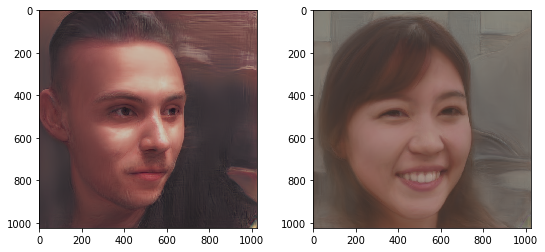

Epoch:  125
Batch:  1
This batch:  ['julien_02', 'rinka_01']
Total time elapsed:  136.68942427635193  s
Feature loss:  74.21236419677734  | Pixel loss:  0.0245685875415802  | Target prop loss:  0.0
Weighted - Feature loss:  7421.236419677734  | Pixel loss:  2.45685875415802  | Target prop loss:  0.0
Total loss:  7423.693359375


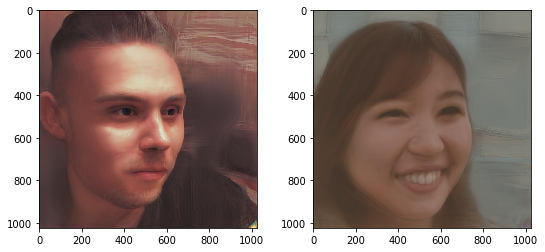

Epoch:  125
Batch:  2
This batch:  ['tsehao_01', 'keisuke_01']
Total time elapsed:  137.26176166534424  s
Feature loss:  42.53150939941406  | Pixel loss:  0.021329641342163086  | Target prop loss:  0.0
Weighted - Feature loss:  4253.150939941406  | Pixel loss:  2.1329641342163086  | Target prop loss:  0.0
Total loss:  4255.28369140625


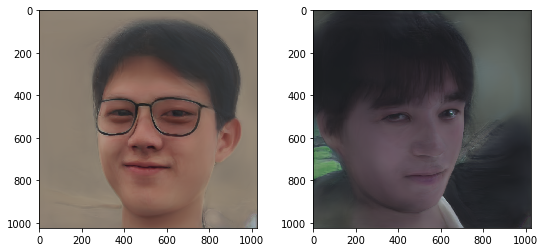

Epoch:  125
Batch:  3
This batch:  ['annie_01', 'kevin_01']
Total time elapsed:  137.8653712272644  s
Feature loss:  40.590606689453125  | Pixel loss:  0.02319822646677494  | Target prop loss:  0.0
Weighted - Feature loss:  4059.0606689453125  | Pixel loss:  2.319822646677494  | Target prop loss:  0.0
Total loss:  4061.38037109375


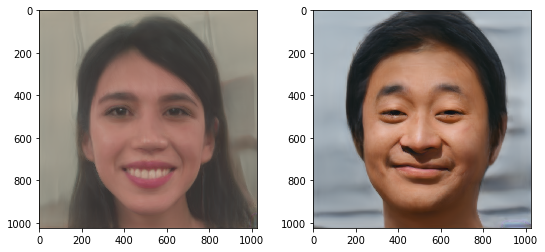

Epoch:  125
Batch:  4
This batch:  ['arnaud_02', 'ali_01']
Total time elapsed:  138.44583415985107  s
Feature loss:  35.753971099853516  | Pixel loss:  0.018367094919085503  | Target prop loss:  0.0
Weighted - Feature loss:  3575.3971099853516  | Pixel loss:  1.8367094919085503  | Target prop loss:  0.0
Total loss:  3577.23388671875


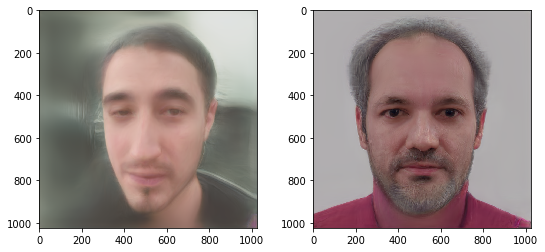

Epoch:  150
Batch:  1
This batch:  ['arnaud_02', 'rinka_01']
Total time elapsed:  164.75943803787231  s
Feature loss:  39.98025131225586  | Pixel loss:  0.0193521436303854  | Target prop loss:  0.0
Weighted - Feature loss:  3998.025131225586  | Pixel loss:  1.9352143630385399  | Target prop loss:  0.0
Total loss:  3999.96044921875


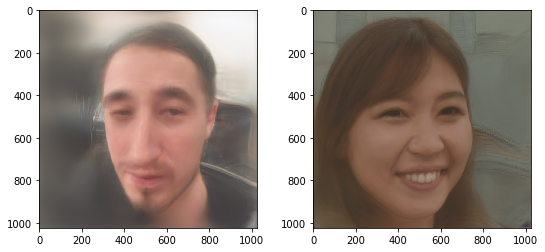

Epoch:  150
Batch:  2
This batch:  ['kevin_01', 'julien_02']
Total time elapsed:  165.33236813545227  s
Feature loss:  74.85662078857422  | Pixel loss:  0.02923334203660488  | Target prop loss:  0.0
Weighted - Feature loss:  7485.662078857422  | Pixel loss:  2.923334203660488  | Target prop loss:  0.0
Total loss:  7488.58544921875


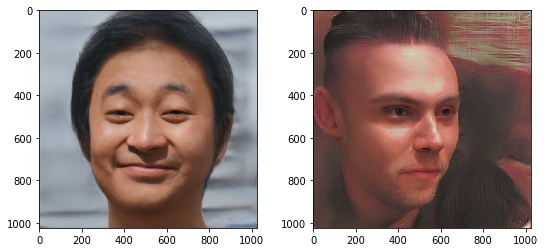

Epoch:  150
Batch:  3
This batch:  ['annie_01', 'keisuke_01']
Total time elapsed:  165.91001296043396  s
Feature loss:  37.88761520385742  | Pixel loss:  0.024030392989516258  | Target prop loss:  0.0
Weighted - Feature loss:  3788.761520385742  | Pixel loss:  2.403039298951626  | Target prop loss:  0.0
Total loss:  3791.16455078125


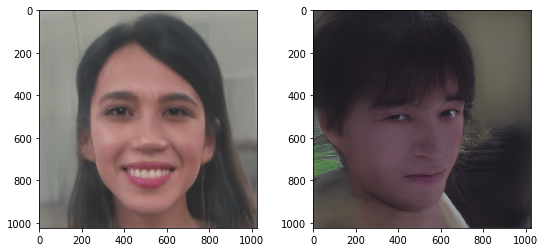

Epoch:  150
Batch:  4
This batch:  ['ali_01', 'tsehao_01']
Total time elapsed:  166.48528838157654  s
Feature loss:  37.58620071411133  | Pixel loss:  0.01385752484202385  | Target prop loss:  0.0
Weighted - Feature loss:  3758.620071411133  | Pixel loss:  1.385752484202385  | Target prop loss:  0.0
Total loss:  3760.005859375


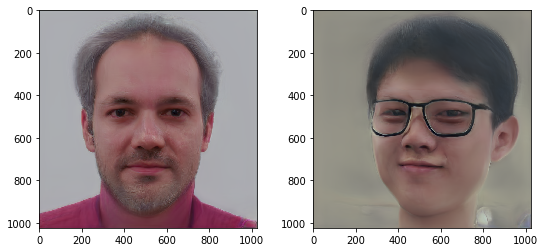

Epoch:  175
Batch:  1
This batch:  ['julien_02', 'annie_01']
Total time elapsed:  191.82825303077698  s
Feature loss:  64.13756561279297  | Pixel loss:  0.021402841433882713  | Target prop loss:  0.0
Weighted - Feature loss:  6413.756561279297  | Pixel loss:  2.1402841433882713  | Target prop loss:  0.0
Total loss:  6415.896484375


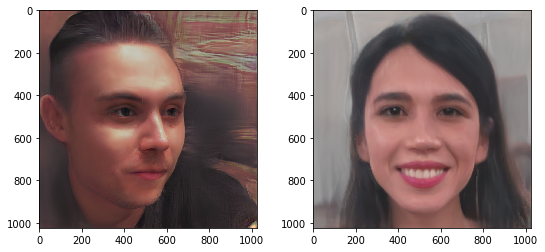

Epoch:  175
Batch:  2
This batch:  ['ali_01', 'rinka_01']
Total time elapsed:  192.46942329406738  s
Feature loss:  35.39352798461914  | Pixel loss:  0.015836279839277267  | Target prop loss:  0.0
Weighted - Feature loss:  3539.352798461914  | Pixel loss:  1.5836279839277267  | Target prop loss:  0.0
Total loss:  3540.9365234375


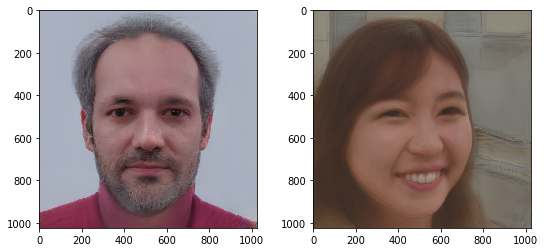

Epoch:  175
Batch:  3
This batch:  ['keisuke_01', 'tsehao_01']
Total time elapsed:  193.035236120224  s
Feature loss:  38.96025466918945  | Pixel loss:  0.01791089028120041  | Target prop loss:  0.0
Weighted - Feature loss:  3896.0254669189453  | Pixel loss:  1.791089028120041  | Target prop loss:  0.0
Total loss:  3897.81640625


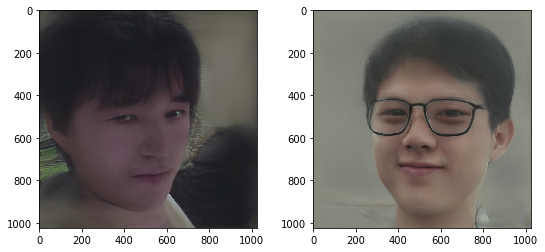

Epoch:  175
Batch:  4
This batch:  ['arnaud_02', 'kevin_01']
Total time elapsed:  193.60114216804504  s
Feature loss:  38.7196044921875  | Pixel loss:  0.020217759534716606  | Target prop loss:  0.0
Weighted - Feature loss:  3871.96044921875  | Pixel loss:  2.0217759534716606  | Target prop loss:  0.0
Total loss:  3873.982177734375


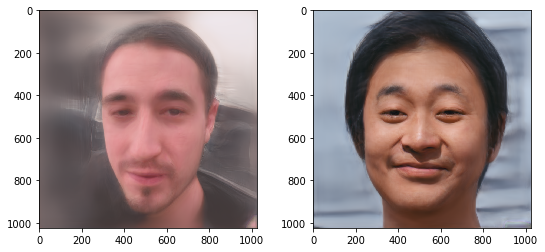

Epoch:  200
Batch:  1
This batch:  ['annie_01', 'kevin_01']
Total time elapsed:  219.32496905326843  s
Feature loss:  35.57245635986328  | Pixel loss:  0.015941796824336052  | Target prop loss:  0.0
Weighted - Feature loss:  3557.245635986328  | Pixel loss:  1.5941796824336052  | Target prop loss:  0.0
Total loss:  3558.83984375


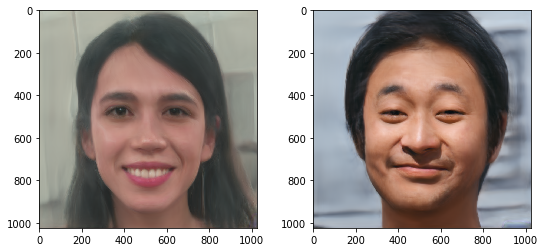

Epoch:  200
Batch:  2
This batch:  ['tsehao_01', 'julien_02']
Total time elapsed:  219.89684867858887  s
Feature loss:  63.8414192199707  | Pixel loss:  0.020274613052606583  | Target prop loss:  0.0
Weighted - Feature loss:  6384.14192199707  | Pixel loss:  2.0274613052606583  | Target prop loss:  0.0
Total loss:  6386.16943359375


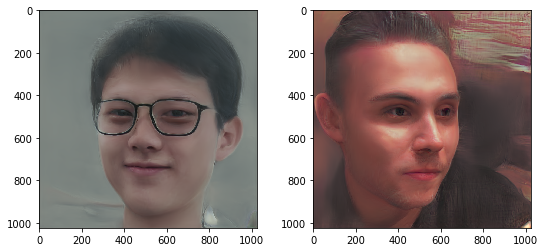

Epoch:  200
Batch:  3
This batch:  ['rinka_01', 'arnaud_02']
Total time elapsed:  220.5058045387268  s
Feature loss:  36.43859100341797  | Pixel loss:  0.018559066578745842  | Target prop loss:  0.0
Weighted - Feature loss:  3643.859100341797  | Pixel loss:  1.8559066578745842  | Target prop loss:  0.0
Total loss:  3645.715087890625


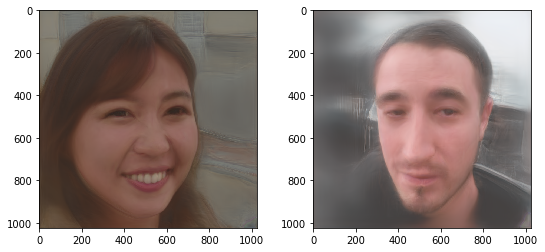

Epoch:  200
Batch:  4
This batch:  ['keisuke_01', 'ali_01']
Total time elapsed:  221.09961533546448  s
Feature loss:  38.94578552246094  | Pixel loss:  0.019209768623113632  | Target prop loss:  0.0
Weighted - Feature loss:  3894.5785522460938  | Pixel loss:  1.9209768623113632  | Target prop loss:  0.0
Total loss:  3896.49951171875


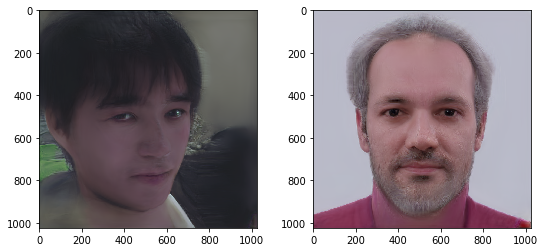

Cycle:  2 LR:  0.001
Epoch:  1
Batch:  1
This batch:  ['annie_01', 'julien_02']
Total time elapsed:  0.2875056266784668  s
Feature loss:  62.161434173583984  | Pixel loss:  0.01939353346824646  | Target prop loss:  0.0
Weighted - Feature loss:  6216.143417358398  | Pixel loss:  1.939353346824646  | Target prop loss:  0.0
Total loss:  6218.0830078125


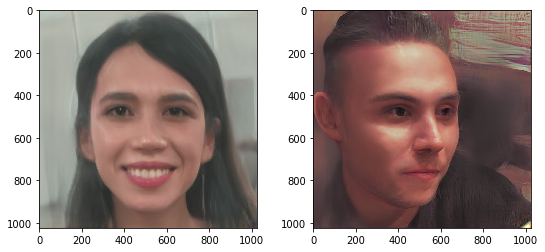

Epoch:  1
Batch:  2
This batch:  ['rinka_01', 'ali_01']
Total time elapsed:  0.8671348094940186  s
Feature loss:  35.6759033203125  | Pixel loss:  0.01572621613740921  | Target prop loss:  0.0
Weighted - Feature loss:  3567.59033203125  | Pixel loss:  1.572621613740921  | Target prop loss:  0.0
Total loss:  3569.162841796875


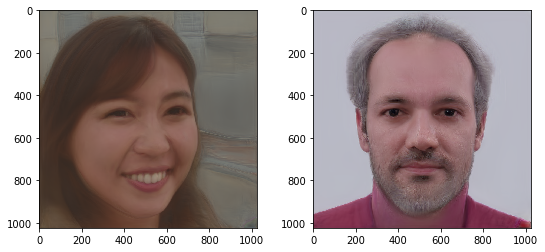

Epoch:  1
Batch:  3
This batch:  ['arnaud_02', 'tsehao_01']
Total time elapsed:  1.4307925701141357  s
Feature loss:  30.769289016723633  | Pixel loss:  0.011675115674734116  | Target prop loss:  0.0
Weighted - Feature loss:  3076.9289016723633  | Pixel loss:  1.1675115674734116  | Target prop loss:  0.0
Total loss:  3078.096435546875


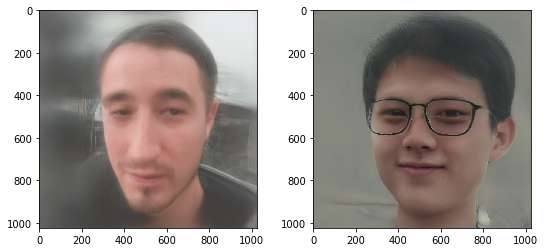

Epoch:  1
Batch:  4
This batch:  ['kevin_01', 'keisuke_01']
Total time elapsed:  2.005694627761841  s
Feature loss:  41.23527908325195  | Pixel loss:  0.022071929648518562  | Target prop loss:  0.0
Weighted - Feature loss:  4123.527908325195  | Pixel loss:  2.2071929648518562  | Target prop loss:  0.0
Total loss:  4125.73486328125


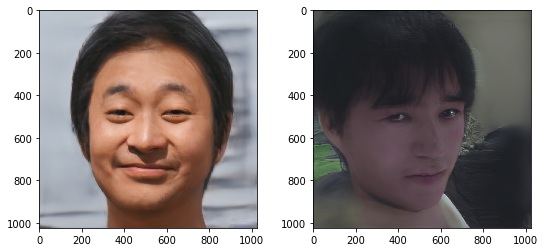

Epoch:  25
Batch:  1
This batch:  ['ali_01', 'arnaud_02']
Total time elapsed:  27.11025094985962  s
Feature loss:  27.31686782836914  | Pixel loss:  0.01010515820235014  | Target prop loss:  0.0
Weighted - Feature loss:  2731.686782836914  | Pixel loss:  1.010515820235014  | Target prop loss:  0.0
Total loss:  2732.697265625


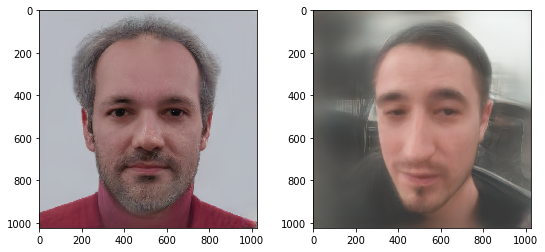

Epoch:  25
Batch:  2
This batch:  ['keisuke_01', 'rinka_01']
Total time elapsed:  27.743051290512085  s
Feature loss:  37.19379425048828  | Pixel loss:  0.021613942459225655  | Target prop loss:  0.0
Weighted - Feature loss:  3719.379425048828  | Pixel loss:  2.1613942459225655  | Target prop loss:  0.0
Total loss:  3721.540771484375


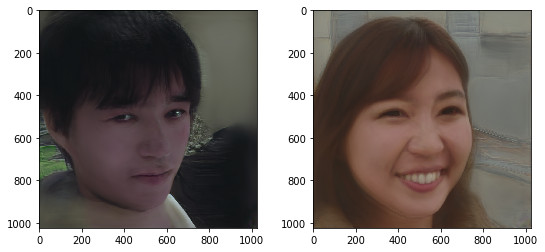

Epoch:  25
Batch:  3
This batch:  ['julien_02', 'annie_01']
Total time elapsed:  28.333745002746582  s
Feature loss:  55.8489990234375  | Pixel loss:  0.019351614639163017  | Target prop loss:  0.0
Weighted - Feature loss:  5584.89990234375  | Pixel loss:  1.9351614639163017  | Target prop loss:  0.0
Total loss:  5586.8349609375


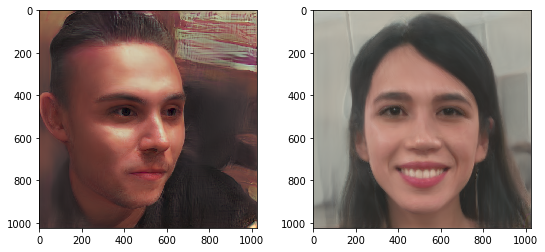

Epoch:  25
Batch:  4
This batch:  ['kevin_01', 'tsehao_01']
Total time elapsed:  28.920410871505737  s
Feature loss:  30.472190856933594  | Pixel loss:  0.011294999159872532  | Target prop loss:  0.0
Weighted - Feature loss:  3047.2190856933594  | Pixel loss:  1.1294999159872532  | Target prop loss:  0.0
Total loss:  3048.348388671875


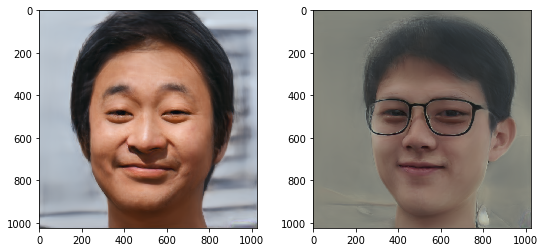

Epoch:  50
Batch:  1
This batch:  ['annie_01', 'keisuke_01']
Total time elapsed:  54.61026215553284  s
Feature loss:  30.814529418945312  | Pixel loss:  0.01881726272404194  | Target prop loss:  0.0
Weighted - Feature loss:  3081.4529418945312  | Pixel loss:  1.8817262724041939  | Target prop loss:  0.0
Total loss:  3083.334716796875


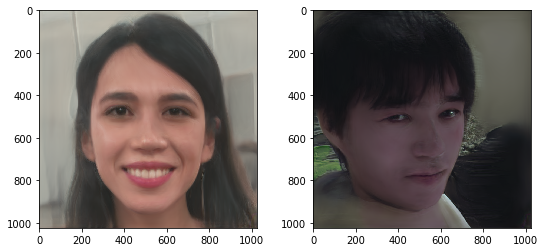

Epoch:  50
Batch:  2
This batch:  ['arnaud_02', 'julien_02']
Total time elapsed:  55.18434381484985  s
Feature loss:  54.47875213623047  | Pixel loss:  0.018598999828100204  | Target prop loss:  0.0
Weighted - Feature loss:  5447.875213623047  | Pixel loss:  1.8598999828100204  | Target prop loss:  0.0
Total loss:  5449.73486328125


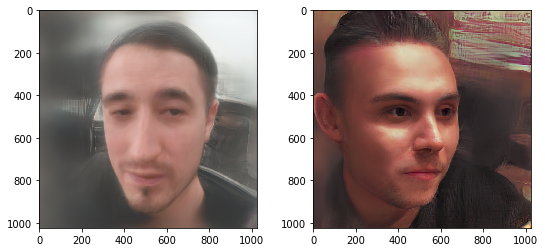

Epoch:  50
Batch:  3
This batch:  ['tsehao_01', 'rinka_01']
Total time elapsed:  55.76597595214844  s
Feature loss:  30.824474334716797  | Pixel loss:  0.011032280512154102  | Target prop loss:  0.0
Weighted - Feature loss:  3082.4474334716797  | Pixel loss:  1.1032280512154102  | Target prop loss:  0.0
Total loss:  3083.55078125


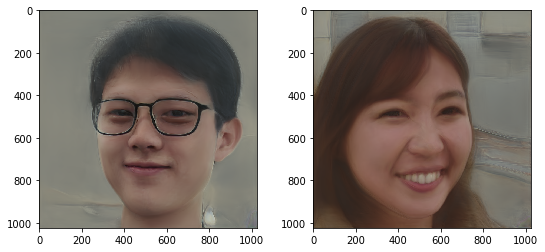

Epoch:  50
Batch:  4
This batch:  ['ali_01', 'kevin_01']
Total time elapsed:  56.363314390182495  s
Feature loss:  29.647506713867188  | Pixel loss:  0.010910887271165848  | Target prop loss:  0.0
Weighted - Feature loss:  2964.7506713867188  | Pixel loss:  1.0910887271165848  | Target prop loss:  0.0
Total loss:  2965.841796875


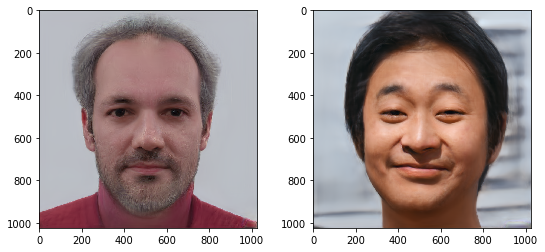

Epoch:  75
Batch:  1
This batch:  ['arnaud_02', 'keisuke_01']
Total time elapsed:  82.10807371139526  s
Feature loss:  30.844877243041992  | Pixel loss:  0.018399398773908615  | Target prop loss:  0.0
Weighted - Feature loss:  3084.487724304199  | Pixel loss:  1.8399398773908615  | Target prop loss:  0.0
Total loss:  3086.32763671875


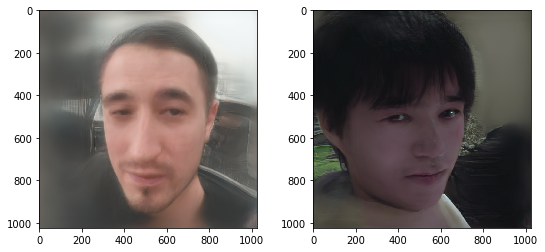

Epoch:  75
Batch:  2
This batch:  ['kevin_01', 'tsehao_01']
Total time elapsed:  82.69230437278748  s
Feature loss:  29.643810272216797  | Pixel loss:  0.010378004051744938  | Target prop loss:  0.0
Weighted - Feature loss:  2964.3810272216797  | Pixel loss:  1.0378004051744938  | Target prop loss:  0.0
Total loss:  2965.4189453125


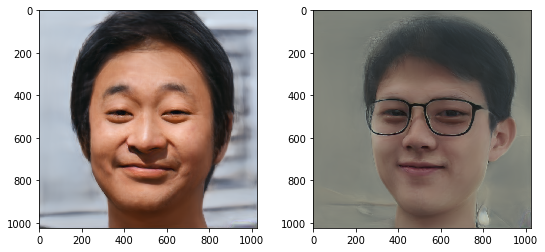

Epoch:  75
Batch:  3
This batch:  ['annie_01', 'julien_02']
Total time elapsed:  83.2909905910492  s
Feature loss:  53.30877685546875  | Pixel loss:  0.018036087974905968  | Target prop loss:  0.0
Weighted - Feature loss:  5330.877685546875  | Pixel loss:  1.8036087974905968  | Target prop loss:  0.0
Total loss:  5332.681640625


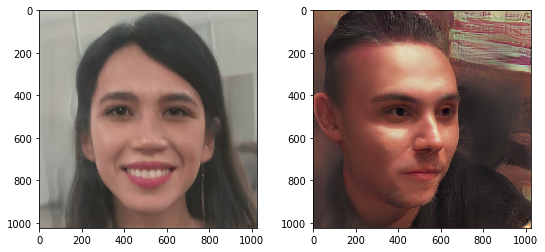

Epoch:  75
Batch:  4
This batch:  ['ali_01', 'rinka_01']
Total time elapsed:  83.90374326705933  s
Feature loss:  29.80594253540039  | Pixel loss:  0.011730561964213848  | Target prop loss:  0.0
Weighted - Feature loss:  2980.594253540039  | Pixel loss:  1.1730561964213848  | Target prop loss:  0.0
Total loss:  2981.767333984375


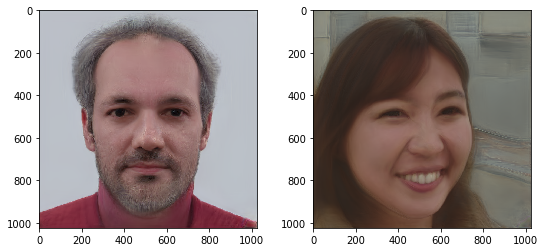

Epoch:  100
Batch:  1
This batch:  ['rinka_01', 'kevin_01']
Total time elapsed:  109.9664990901947  s
Feature loss:  33.60493850708008  | Pixel loss:  0.013927849940955639  | Target prop loss:  0.0
Weighted - Feature loss:  3360.493850708008  | Pixel loss:  1.3927849940955639  | Target prop loss:  0.0
Total loss:  3361.88671875


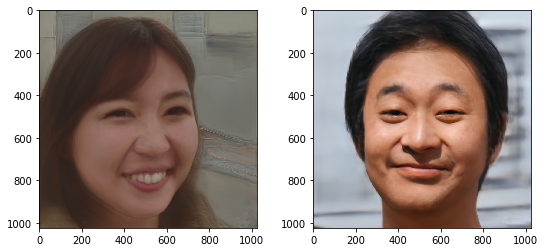

Epoch:  100
Batch:  2
This batch:  ['ali_01', 'julien_02']
Total time elapsed:  110.61062908172607  s
Feature loss:  52.289588928222656  | Pixel loss:  0.016630684956908226  | Target prop loss:  0.0
Weighted - Feature loss:  5228.958892822266  | Pixel loss:  1.6630684956908226  | Target prop loss:  0.0
Total loss:  5230.6220703125


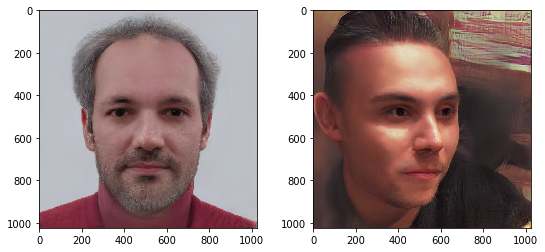

Epoch:  100
Batch:  3
This batch:  ['keisuke_01', 'arnaud_02']
Total time elapsed:  111.19864773750305  s
Feature loss:  30.455408096313477  | Pixel loss:  0.018427232280373573  | Target prop loss:  0.0
Weighted - Feature loss:  3045.5408096313477  | Pixel loss:  1.8427232280373573  | Target prop loss:  0.0
Total loss:  3047.383544921875


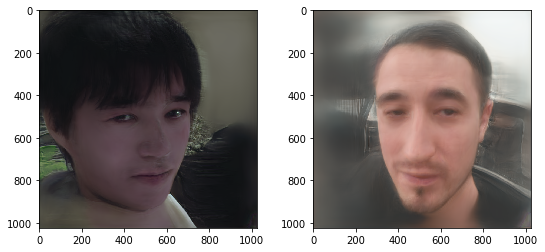

Epoch:  100
Batch:  4
This batch:  ['annie_01', 'tsehao_01']
Total time elapsed:  111.82255029678345  s
Feature loss:  24.336400985717773  | Pixel loss:  0.008225783705711365  | Target prop loss:  0.0
Weighted - Feature loss:  2433.6400985717773  | Pixel loss:  0.8225783705711365  | Target prop loss:  0.0
Total loss:  2434.462646484375


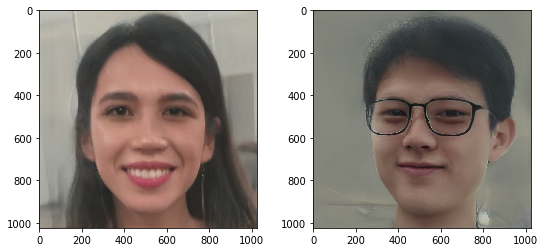

Epoch:  125
Batch:  1
This batch:  ['tsehao_01', 'kevin_01']
Total time elapsed:  138.1906282901764  s
Feature loss:  28.24986457824707  | Pixel loss:  0.009416654706001282  | Target prop loss:  0.0
Weighted - Feature loss:  2824.986457824707  | Pixel loss:  0.9416654706001282  | Target prop loss:  0.0
Total loss:  2825.92822265625


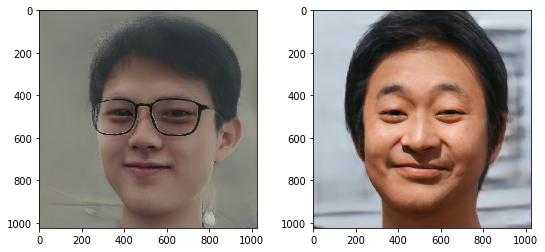

Epoch:  125
Batch:  2
This batch:  ['julien_02', 'annie_01']
Total time elapsed:  138.8107488155365  s
Feature loss:  51.72653579711914  | Pixel loss:  0.016626017168164253  | Target prop loss:  0.0
Weighted - Feature loss:  5172.653579711914  | Pixel loss:  1.6626017168164253  | Target prop loss:  0.0
Total loss:  5174.31640625


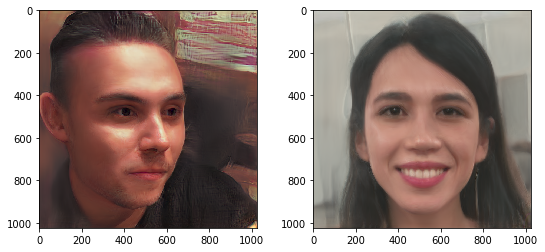

Epoch:  125
Batch:  3
This batch:  ['rinka_01', 'arnaud_02']
Total time elapsed:  139.3921217918396  s
Feature loss:  28.971460342407227  | Pixel loss:  0.01182511355727911  | Target prop loss:  0.0
Weighted - Feature loss:  2897.1460342407227  | Pixel loss:  1.182511355727911  | Target prop loss:  0.0
Total loss:  2898.32861328125


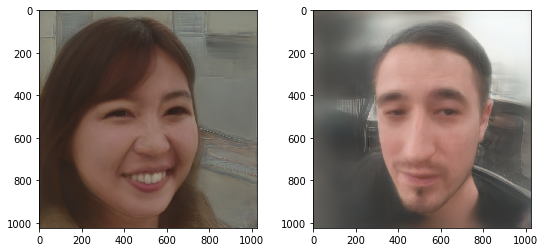

Epoch:  125
Batch:  4
This batch:  ['ali_01', 'keisuke_01']
Total time elapsed:  139.97508120536804  s
Feature loss:  29.94063377380371  | Pixel loss:  0.017507152631878853  | Target prop loss:  0.0
Weighted - Feature loss:  2994.063377380371  | Pixel loss:  1.7507152631878853  | Target prop loss:  0.0
Total loss:  2995.814208984375


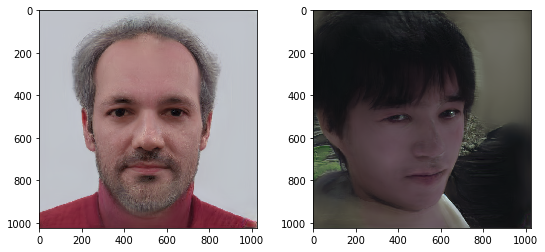

Epoch:  150
Batch:  1
This batch:  ['julien_02', 'keisuke_01']
Total time elapsed:  165.79756236076355  s
Feature loss:  57.351348876953125  | Pixel loss:  0.026429912075400352  | Target prop loss:  0.0
Weighted - Feature loss:  5735.1348876953125  | Pixel loss:  2.6429912075400352  | Target prop loss:  0.0
Total loss:  5737.77783203125


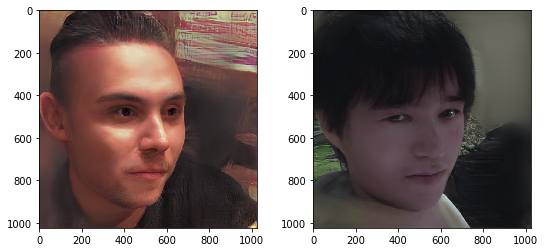

Epoch:  150
Batch:  2
This batch:  ['ali_01', 'kevin_01']
Total time elapsed:  166.41526460647583  s
Feature loss:  27.943815231323242  | Pixel loss:  0.009763305075466633  | Target prop loss:  0.0
Weighted - Feature loss:  2794.381523132324  | Pixel loss:  0.9763305075466633  | Target prop loss:  0.0
Total loss:  2795.35791015625


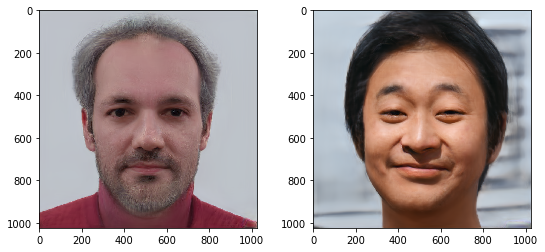

Epoch:  150
Batch:  3
This batch:  ['tsehao_01', 'annie_01']
Total time elapsed:  167.03461503982544  s
Feature loss:  23.862218856811523  | Pixel loss:  0.008090668357908726  | Target prop loss:  0.0
Weighted - Feature loss:  2386.2218856811523  | Pixel loss:  0.8090668357908726  | Target prop loss:  0.0
Total loss:  2387.031005859375


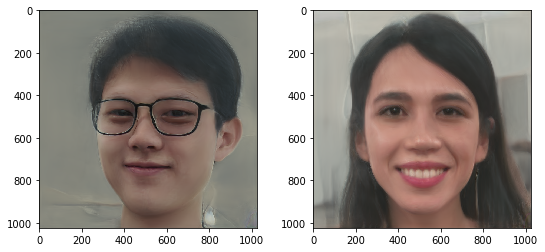

Epoch:  150
Batch:  4
This batch:  ['rinka_01', 'arnaud_02']
Total time elapsed:  167.6650002002716  s
Feature loss:  28.789031982421875  | Pixel loss:  0.011772983707487583  | Target prop loss:  0.0
Weighted - Feature loss:  2878.9031982421875  | Pixel loss:  1.1772983707487583  | Target prop loss:  0.0
Total loss:  2880.08056640625


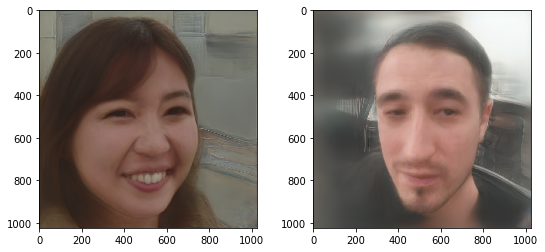

Epoch:  175
Batch:  1
This batch:  ['rinka_01', 'kevin_01']
Total time elapsed:  193.20837378501892  s
Feature loss:  32.117515563964844  | Pixel loss:  0.013165172189474106  | Target prop loss:  0.0
Weighted - Feature loss:  3211.7515563964844  | Pixel loss:  1.3165172189474106  | Target prop loss:  0.0
Total loss:  3213.06787109375


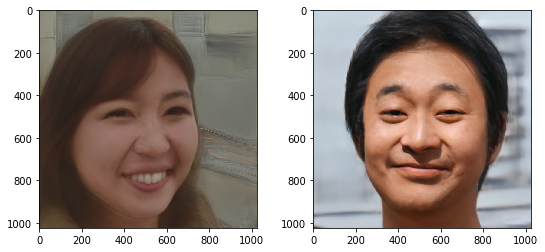

Epoch:  175
Batch:  2
This batch:  ['julien_02', 'ali_01']
Total time elapsed:  193.84785437583923  s
Feature loss:  50.61861801147461  | Pixel loss:  0.015546850860118866  | Target prop loss:  0.0
Weighted - Feature loss:  5061.861801147461  | Pixel loss:  1.5546850860118866  | Target prop loss:  0.0
Total loss:  5063.41650390625


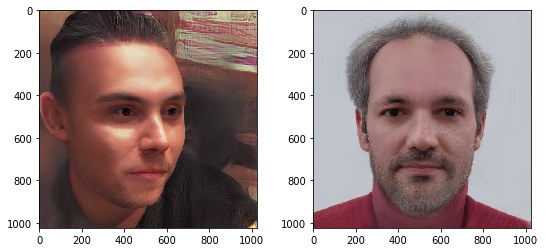

Epoch:  175
Batch:  3
This batch:  ['keisuke_01', 'tsehao_01']
Total time elapsed:  194.4162678718567  s
Feature loss:  30.09954261779785  | Pixel loss:  0.01716524548828602  | Target prop loss:  0.0
Weighted - Feature loss:  3009.954261779785  | Pixel loss:  1.7165245488286018  | Target prop loss:  0.0
Total loss:  3011.6708984375


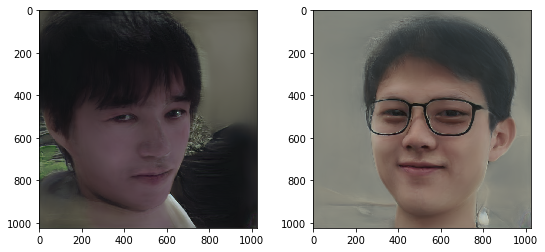

Epoch:  175
Batch:  4
This batch:  ['annie_01', 'arnaud_02']
Total time elapsed:  194.99082255363464  s
Feature loss:  23.613616943359375  | Pixel loss:  0.0086724404245615  | Target prop loss:  0.0
Weighted - Feature loss:  2361.3616943359375  | Pixel loss:  0.86724404245615  | Target prop loss:  0.0
Total loss:  2362.22900390625


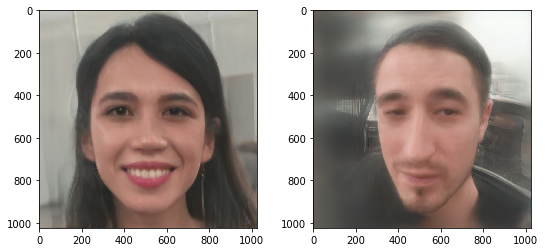

Epoch:  200
Batch:  1
This batch:  ['keisuke_01', 'kevin_01']
Total time elapsed:  220.69227480888367  s
Feature loss:  32.73829650878906  | Pixel loss:  0.019143668934702873  | Target prop loss:  0.0
Weighted - Feature loss:  3273.8296508789062  | Pixel loss:  1.9143668934702873  | Target prop loss:  0.0
Total loss:  3275.743896484375


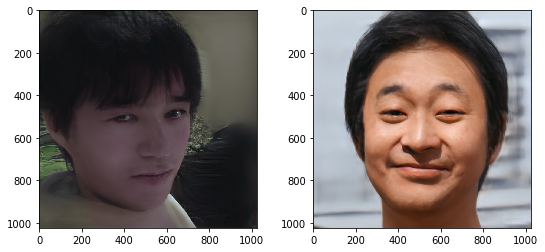

Epoch:  200
Batch:  2
This batch:  ['arnaud_02', 'rinka_01']
Total time elapsed:  221.2920742034912  s
Feature loss:  28.07511329650879  | Pixel loss:  0.011806818656623363  | Target prop loss:  0.0
Weighted - Feature loss:  2807.511329650879  | Pixel loss:  1.1806818656623363  | Target prop loss:  0.0
Total loss:  2808.69189453125


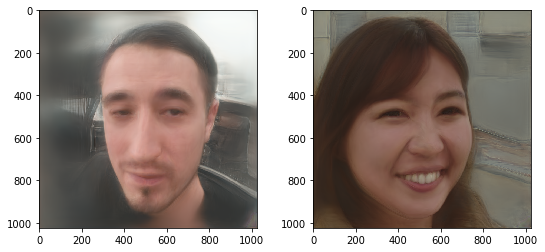

Epoch:  200
Batch:  3
This batch:  ['tsehao_01', 'ali_01']
Total time elapsed:  221.89310312271118  s
Feature loss:  23.821359634399414  | Pixel loss:  0.007215583696961403  | Target prop loss:  0.0
Weighted - Feature loss:  2382.1359634399414  | Pixel loss:  0.7215583696961403  | Target prop loss:  0.0
Total loss:  2382.857666015625


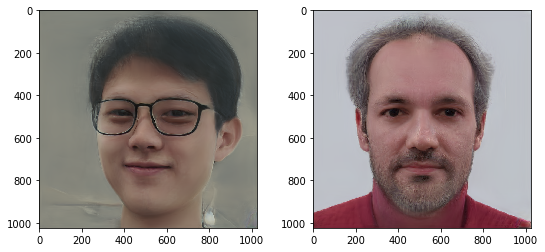

Epoch:  200
Batch:  4
This batch:  ['julien_02', 'annie_01']
Total time elapsed:  222.50246477127075  s
Feature loss:  51.386016845703125  | Pixel loss:  0.016148358583450317  | Target prop loss:  0.0
Weighted - Feature loss:  5138.6016845703125  | Pixel loss:  1.6148358583450317  | Target prop loss:  0.0
Total loss:  5140.21630859375


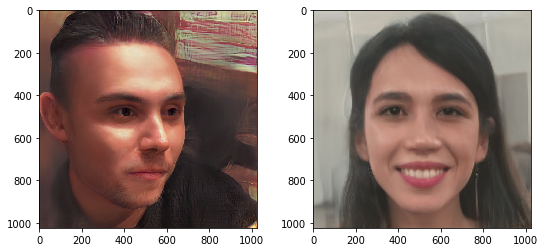

Total time elapsed for all training cycles:  671.2554907798767  s


In [4]:
TrainFaceModel(FaceModel,FaceData)

### 5. Save FaceData and FaceModel

In [77]:
DataPath = 'UsideU FaceSpace/FaceData.obj'
ModelPath = 'UsideU FaceSpace/FaceModel_weights.pth'
SaveFaceSpace(FaceData, DataPath, FaceModel, ModelPath)

FaceData saved to  UsideU FaceSpace/FaceData.obj
FaceModel saved to  UsideU FaceSpace/FaceModel_weights.pth


### 5b. Load FaceData and FaceModel from saved paths

In [2]:
DataPath = 'UsideU FaceSpace/FaceData.obj'
ModelPath = 'UsideU FaceSpace/FaceModel_weights.pth'
FaceData, FaceModel = LoadFaceSpace(DataPath, ModelPath)

No Zdims explicitly specified, inferring Zdims from FaceData, Zdims=8
Loading model weights from path...
Done


### 6. Show some of the faces generated by the FaceModel
#### Faces based on weighted sum of orthogonal vectors (optional random sum), interpolate between orthogonal vectors for face morphing 

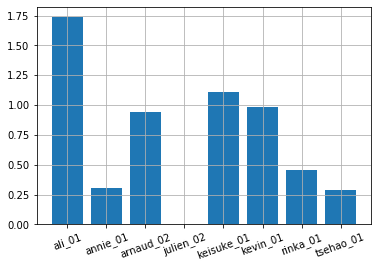

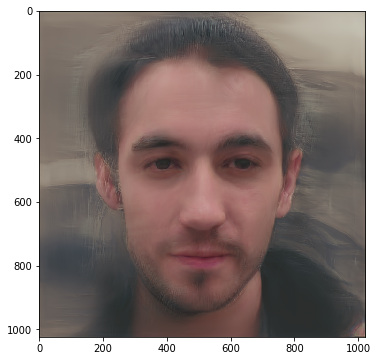

In [34]:
RandomFaceVectors = ShowFace(FaceModel, FaceData=FaceData, Random=True, PrintGraph=True)

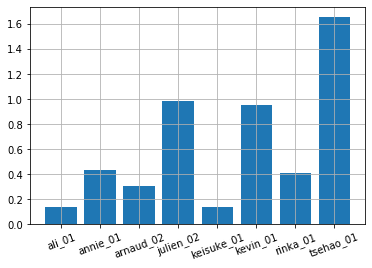

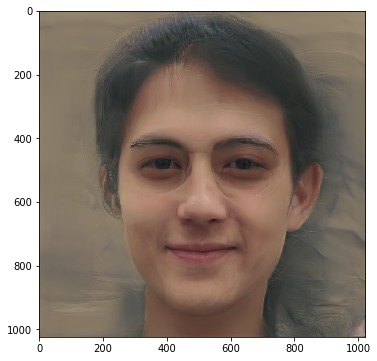

In [76]:
RandomFaceVectors = ShowFace(FaceModel, FaceData=FaceData, Random=True, PrintGraph=True)

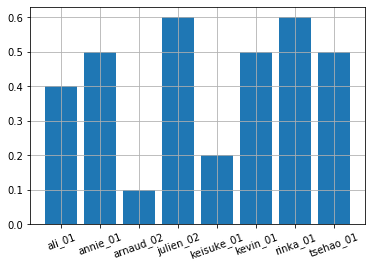

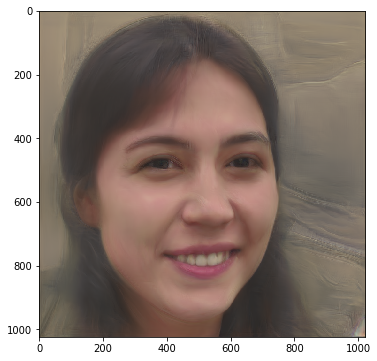

In [51]:
FaceVectors = [0.4,0.5,0.1,0.6,0.2,0.5,0.6,0.5]
ShowFace(FaceModel, FaceVectors=FaceVectors, FaceData=FaceData)

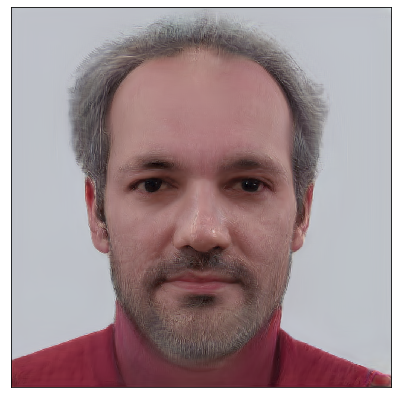

In [6]:
import random
from plot_utils import InterpolateCompressed
FixedLatents = [FixedLatent for FixedLatent in FaceData.Zspace]
random.shuffle(FixedLatents)
InterpolateCompressed(FixedLatents, FaceModel, Steps=8, ClearOutput=True, FigSize=(7,7), Tiled=False)